# Is this Picasso? An AI goes to the museum.

---

### BASIC OPERATIONS
In this notebook I will make basic operations with images and define the functions needed to build a dataset for this
 project.

___
### AUTOUPDATE UTILS

In [81]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [82]:
# %reload_ext autoreload

___
### IMPORTS

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

from utils.data_handling import get_collection, process_collection, show_collection
from utils.image_processing import color_clustering, get_img_rgb, reduce_col_palette, resize_img, square_img
from utils.misc import mklist

___
### MODULES SETTINGS

In [84]:
%matplotlib inline

sns.set_theme(style='whitegrid',
              rc={'figure.figsize': (20, 10),
                  'axes.grid': False})

___
### GETTING IMAGES

In [85]:
collection = get_collection(path='../data/raw_images/sample_img',
                            extensions=['.jpg'])

7 images found in sample_img


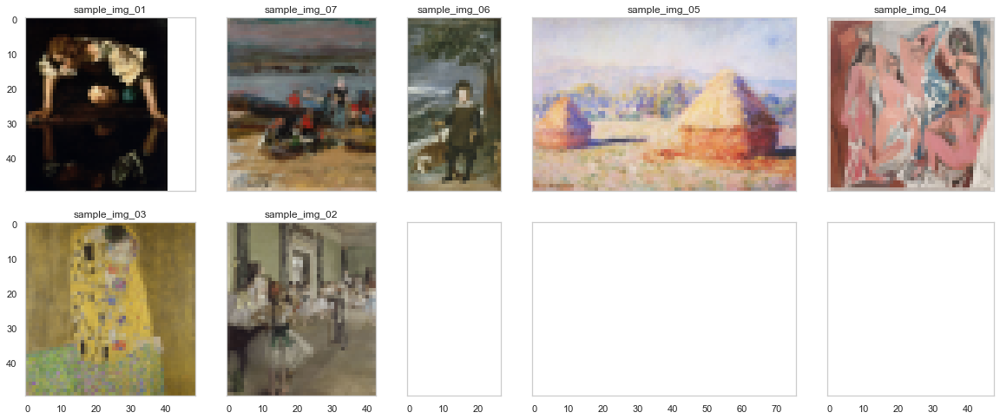

In [86]:
show_collection(collection)

___
### PROCESSING IMAGES

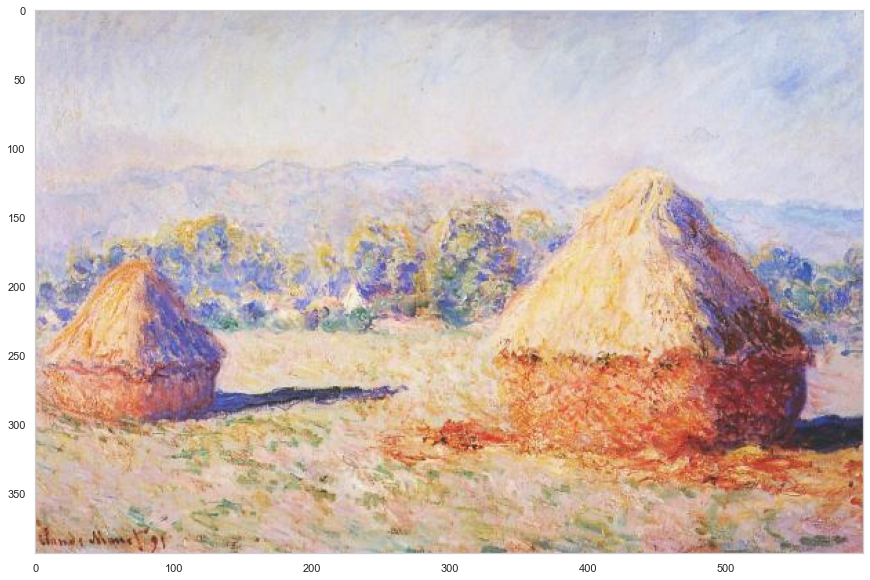

In [87]:
img = get_img_rgb('../data/raw_images/sample_img/sample_img_05.jpg')
plt.imshow(img);

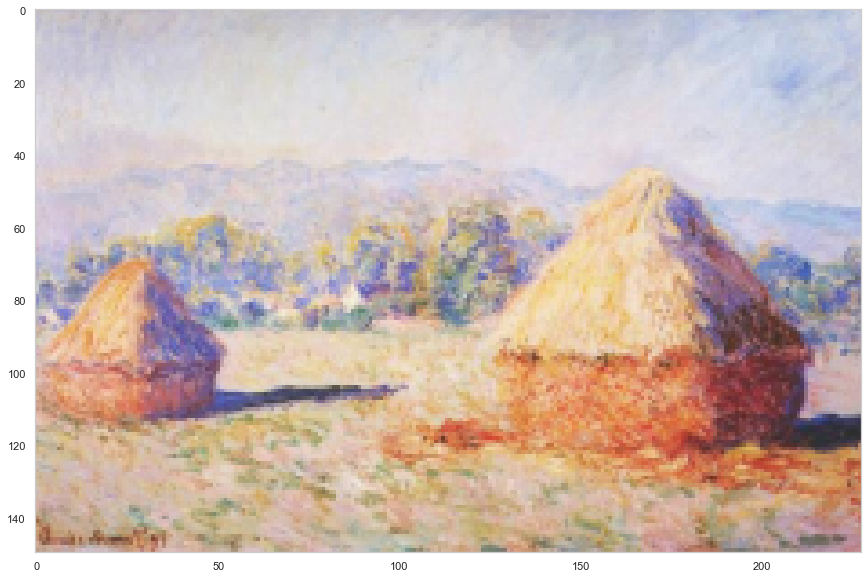

In [88]:
img = resize_img(img, 150)
plt.imshow(img);

Palette reduced to 125 colors.


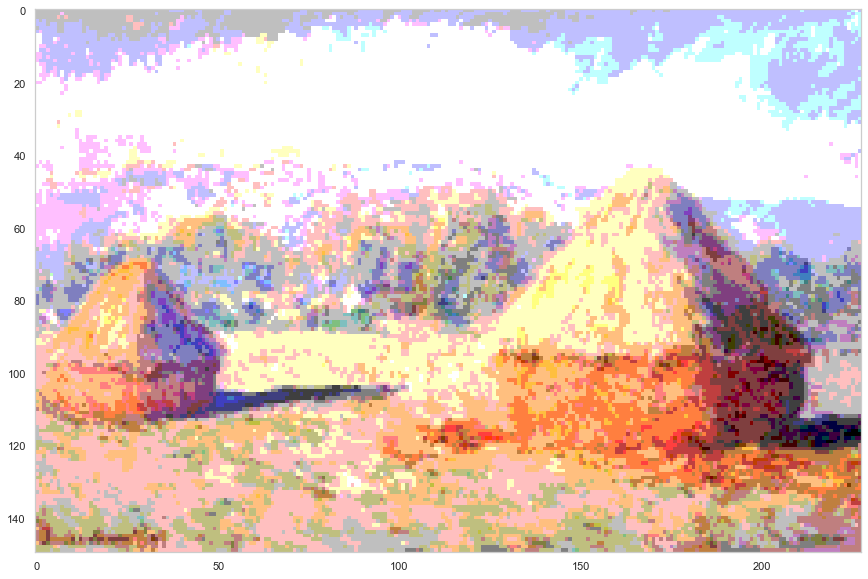

In [89]:
img = reduce_col_palette(img, bins=5, info=True)
plt.imshow(img);

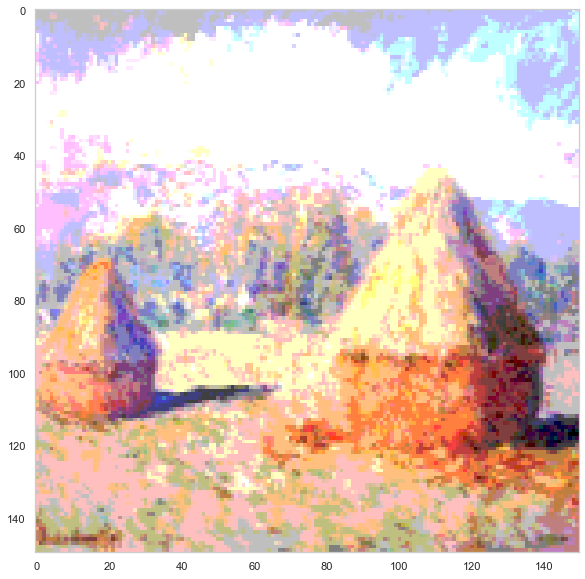

In [90]:
img = square_img(img, 150)
plt.imshow(img);

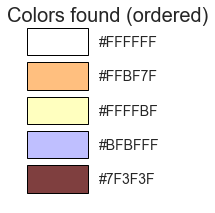

In [91]:
colors = color_clustering(img, color_mode='RGB', num_of_colors=5, show_chart=True)

___
### PROCESSING COLLECTION

In [92]:
collection

[PurePosixPath('../data/raw_images/sample_img/sample_img_01.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_07.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_06.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_05.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_04.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_03.jpg'),
 PurePosixPath('../data/raw_images/sample_img/sample_img_02.jpg')]

In [93]:
%%time

data, errors = process_collection(collection,
                                  color_mode='RGB',
                                  label='sample_images',
                                  save=True,
                                  save_path='../data/processed_img/')

FileExistsError: "sample_images" folder already exists in your saving path.
Remove it or type a different label name.

CPU times: user 6.44 ms, sys: 2.12 ms, total: 8.56 ms
Wall time: 2.26 ms


___
### BUILDING DATASET

First of all, I will create a *collection* for each artist that later on I will merge into a *museum*.

In [94]:
artists = ['caravaggio', 'degas', 'goya', 'hokusai', 'kahlo',
           'kandinsky', 'klimt', 'lichtenstein', 'mondrian', 'monet',
           'picasso', 'pollock', 'sorolla', 'velazquez', 'warhol']

In [95]:
valid_extensions = ['.jpg', '.jpeg']

caravaggio_collection = get_collection('../data/raw_images/caravaggio', valid_extensions)
degas_collection = get_collection('../data/raw_images/degas', valid_extensions)
goya_collection = get_collection('../data/raw_images/goya', valid_extensions)
hokusai_collection = get_collection('../data/raw_images/hokusai', valid_extensions)
kahlo_collection = get_collection('../data/raw_images/kahlo', valid_extensions)
kandinsky_collection = get_collection('../data/raw_images/kandinsky', valid_extensions)
klimt_collection = get_collection('../data/raw_images/klimt', valid_extensions)
lichtenstein_collection = get_collection('../data/raw_images/lichtenstein', valid_extensions)
mondrian_collection = get_collection('../data/raw_images/mondrian', valid_extensions)
monet_collection = get_collection('../data/raw_images/monet', valid_extensions)
picasso_collection = get_collection('../data/raw_images/picasso', valid_extensions)
pollock_collection = get_collection('../data/raw_images/pollock', valid_extensions)
sorolla_collection = get_collection('../data/raw_images/sorolla', valid_extensions)
velazquez_collection = get_collection('../data/raw_images/velazquez', valid_extensions)
warhol_collection = get_collection('../data/raw_images/warhol', valid_extensions)

collections = [caravaggio_collection, degas_collection, goya_collection, hokusai_collection, kahlo_collection,
               kandinsky_collection, klimt_collection, lichtenstein_collection, mondrian_collection, monet_collection,
               picasso_collection, pollock_collection, sorolla_collection, velazquez_collection, warhol_collection]

88 images found in caravaggio
626 images found in degas
390 images found in goya
267 images found in hokusai
100 images found in kahlo
227 images found in kandinsky
161 images found in klimt
152 images found in lichtenstein
100 images found in mondrian
1366 images found in monet
1169 images found in picasso
90 images found in pollock
367 images found in sorolla
134 images found in velazquez
231 images found in warhol


In [96]:
caravaggio_dset, degas_dset, goya_dset, hokusai_dset, kahlo_dset = mklist(5)
kandinsky_dset, klimt_dset, lichtenstein_dset, mondrian_dset, monet_dset = mklist(5)
picasso_dset, pollock_dset, sorolla_dset, velazquez_dset, warhol_dset = mklist(5)

collections_data = [caravaggio_dset, degas_dset, goya_dset, hokusai_dset, kahlo_dset,
                    kandinsky_dset, klimt_dset, lichtenstein_dset, mondrian_dset, monet_dset,
                    picasso_dset, pollock_dset, sorolla_dset, velazquez_dset, warhol_dset]

In [97]:
caravaggio_errors, degas_errors, goya_errors, hokusai_errors, kahlo_errors = mklist(5)
kandinsky_errors, klimt_errors, lichtenstein_errors, mondrian_errors, monet_errors = mklist(5)
picasso_errors, pollock_errors, sorolla_errors, velazquez_errors, warhol_errors = mklist(5)

collections_errors = [caravaggio_errors, degas_errors, goya_errors, hokusai_errors, kahlo_errors,
                      kandinsky_errors, klimt_errors, lichtenstein_errors, mondrian_errors, monet_errors,
                      picasso_errors, pollock_errors, sorolla_errors, velazquez_errors, warhol_errors]

In [98]:
%%time

for artist, collection, collection_data, collection_error in zip(artists,
                                                                 collections,
                                                                 collections_data,
                                                                 collections_errors):
    collection_data, collection_error = process_collection(collection,
                                                           color_mode='RGB',
                                                           label=f'{artist}',
                                                           save=True,
                                                           save_path='../data/processed_img/')

FileExistsError: "caravaggio" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "degas" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "goya" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "hokusai" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "kahlo" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "kandinsky" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "klimt" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "lichtenstein" folder already exists in your saving path.
Remove it or type a different label name.

FileExistsError: "mondrian" folder already exists in your saving path.
Remove it or type a diff

___
### AUXILIAR DATA

In [99]:
import pandas as pd

import plotly.graph_objs as go
from plotly.offline import iplot

In [100]:
sample_img = get_img_rgb('../data/raw_images/sample_img/sample_img_05.jpg')
sample_img_flat = img.flatten()

sample_img_reduced = reduce_col_palette(sample_img, bins=5, info=False)
sample_img_reduced_flat = sample_img_reduced.flatten()

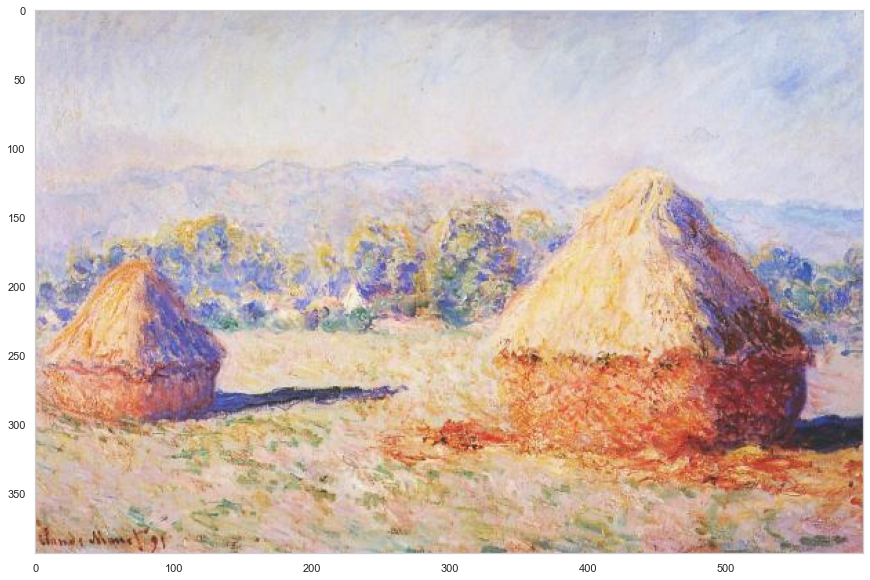

In [101]:
plt.imshow(sample_img);

In [102]:
scatter_3d = go.Scatter3d(x=sample_img_flat[:-2:3],
                          y=sample_img_flat[1:-1:3],
                          z=sample_img_flat[2::3],
                          mode='markers',
                          marker=dict(size=2.5,
                                      color='rgb(93,145,153)'))

layout = go.Layout(margin=dict(t=10, r=10, b=10, l=10,
                               pad=50),
                   scene=dict(xaxis_title='R channel',
                              yaxis_title='G channel',
                              zaxis_title='B channel'),
                   autosize=False,
                   width=800,
                   height=800)

fig = go.Figure(data=scatter_3d, layout=layout)

iplot(fig)

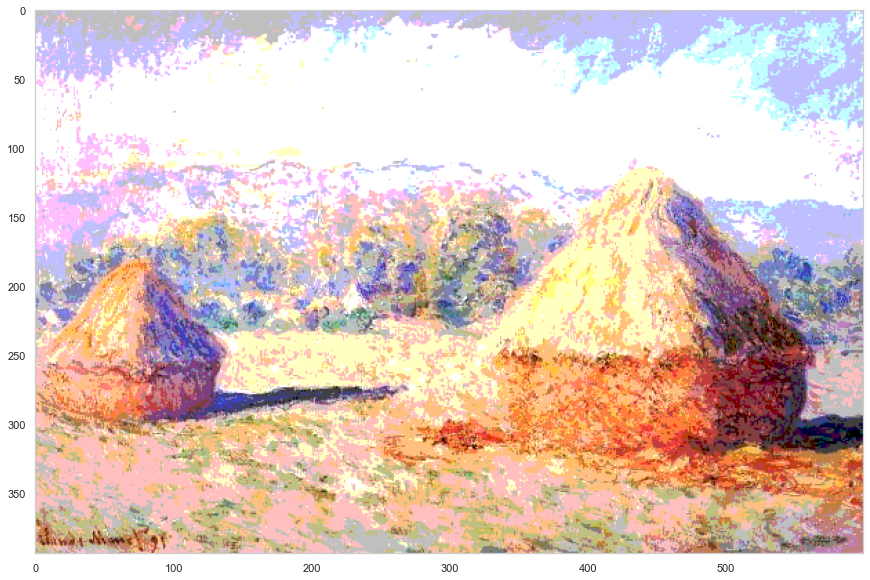

In [103]:
plt.imshow(sample_img_reduced);

In [104]:
scatter_3d = go.Scatter3d(x=sample_img_reduced_flat[:-2:3],
                          y=sample_img_reduced_flat[1:-1:3],
                          z=sample_img_reduced_flat[2::3],
                          mode='markers',
                          marker=dict(size=2.5,
                                      color='rgb(93,145,153)'))

layout = go.Layout(margin=dict(t=10, r=10, b=10, l=10,
                               pad=50),
                   scene=dict(xaxis_title='R channel',
                              yaxis_title='G channel',
                              zaxis_title='B channel'),
                   autosize=False,
                   width=800,
                   height=800)

fig = go.Figure(data=scatter_3d, layout=layout)

iplot(fig)